# Curso Modelado Numérico de la Atmósfera

## Tarea 2

Dada la siguiente malla de datos de temperatura, pronosticar la evolución del campo de la variable para una hora. Aplicar el método de Euler para las derivadas zonal y meridional.

### Datos
* Velocidad del viento = CONST = 7m/s
* Dirección del viento = CONST = 140°
* Resolución del dominio dx = dy = 18km
* Paso del tiempo ¿?

$$
TEMP = \begin{bmatrix}
21.2 & 22.8 & 23.5 & 24.8 & 26.5 \\
22.7 & 24.4 & 25.2 & 26.5 & 28.4 \\
24.3 & 26.1 & 27.0 & 28.4 & 30.4 \\
26.0 & 27.9 & 28.9 & 30.4 & 32.5 \\
27.8 & 29.9 & 30.9 & 32.5 & 34.8 \\
29.7 & 32.0 & 33.0 & 34.8 & 37.2 \\
31.8 & 34.2 & 35.3 & 37.2 & 39.8
\end{bmatrix}$$

---

## Solución

La ecuación que estamos tratando de resolver es la siguiente:

$$
\frac{\partial T }{\partial t} + u \frac{\partial T}{\partial x} + v \frac{\partial T}{\partial y} = 0
$$

En donde el paso de tiempo estara determinado por

$$
\frac{\lvert u\rvert*\Delta t}{\Delta x} + \frac{\lvert v\rvert*\Delta t}{\Delta y} \leq 0.06
\\
$$

Que resulta en

$$
\Delta t \leq \frac{0.06}{\left(\frac{\lvert u\rvert}{\Delta x} + \frac{\lvert v\rvert}{\Delta y}\right)}
$$

In [1]:
# Manejo de datos
import numpy as np
import pandas as pd
import xarray as xr

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
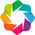

In [2]:
# Plots y graficos interactivos
import holoviews as hv
import matplotlib.pyplot as plt
import panel as pn
from panel.interact import interact, fixed

pn.extension()
hv.extension("bokeh")

In [3]:
# Declaración de datos
dx = dy = 18
magw = 7
angw = 140
temp_arr = np.array(
    [
        [21.2, 22.8, 23.5, 24.8, 26.5],
        [22.7, 24.4, 25.2, 26.5, 28.4],
        [24.3, 26.1, 27.0, 28.4, 30.4],
        [26.0, 27.9, 28.9, 30.4, 32.5],
        [27.8, 29.9, 30.9, 32.5, 34.8],
        [29.7, 32.0, 33.0, 34.8, 37.2],
        [31.8, 34.2, 35.3, 37.2, 39.8],
    ]
)

In [4]:
# Calculo de las componentes u,v
u = magw * np.cos(np.deg2rad(140))
v = magw * np.sin(np.deg2rad(140))

print(f"{u = }\n{v = }")

u = -5.362311101832845
v = 4.499513267805776


Con los valores obtenidos para u y v, calculamos el valor límite que debe tener $\Delta t$

In [5]:
dt_approx = 0.06 / ((np.abs(u) / (dx * 1000)) + (np.abs(v) / (dy * 1000)))
print(f"{dt_approx = }")

dt_approx = 109.5132056219711


Entonces tomamos

$$
\Delta t \approx 100s
$$

Construimos una grilla que cumpla con $\Delta x$ y $\Delta y$ (no es necesario realizar esto, pero es util para tener coordenadas definidas dentro de xarray)

In [6]:
lon = np.arange(-90, -90 + temp_arr.shape[1] * dx, dx)
lat = np.arange(-50, -50 + temp_arr.shape[0] * dy, dy)
print(f"{lon = }\n{lat = }")

lon = array([-90, -72, -54, -36, -18])
lat = array([-50, -32, -14,   4,  22,  40,  58])


Construimos nuestra matriz de datos con `lat` y `lon` como coordenadas

In [7]:
temp = xr.DataArray(temp_arr, coords=[("lat", lat[::-1]), ("lon", lon)])

# Metadata adicional para variables/coordenadas que sigue la convención CF
temp.lon.attrs["long_name"] = "Longitude"
temp.lon.attrs["units"] = "degrees_east"
temp.lat.attrs["long_name"] = "Latitude"
temp.lat.attrs["units"] = "degrees_north"
temp.attrs["long_name"] = "Temperature"
temp.attrs["units"] = "degrees_C"
temp.name = "temperature"

temp

<xarray.DataArray 'temperature' (lat: 7, lon: 5)>
array([[21.2, 22.8, 23.5, 24.8, 26.5],
       [22.7, 24.4, 25.2, 26.5, 28.4],
       [24.3, 26.1, 27. , 28.4, 30.4],
       [26. , 27.9, 28.9, 30.4, 32.5],
       [27.8, 29.9, 30.9, 32.5, 34.8],
       [29.7, 32. , 33. , 34.8, 37.2],
       [31.8, 34.2, 35.3, 37.2, 39.8]])
Coordinates:
  * lat      (lat) int32 58 40 22 4 -14 -32 -50
  * lon      (lon) int32 -90 -72 -54 -36 -18
Attributes:
    long_name:  Temperature
    units:      degrees_C

In [8]:
# Arreglos para grafico de quivers
u_arr = np.full_like(temp_arr, u)
v_arr = np.full_like(temp_arr, v)

Se puede explorar nuestra malla de datos iniciales

Text(0.5, 1.0, 'En grilla')

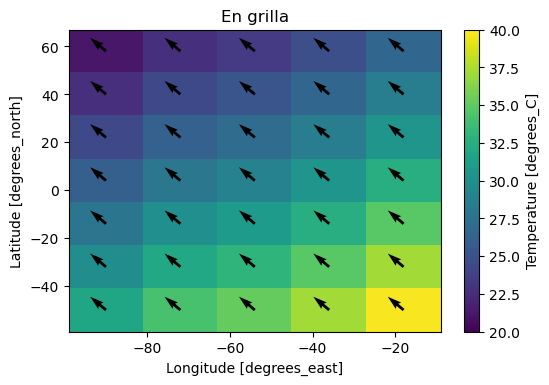

In [9]:
fig, ax = plt.subplots(dpi=100)
temp.plot(ax=ax, vmin=20, vmax=40)
ax.quiver(lon, lat, u_arr, v_arr)
ax.set_title("En grilla")

Text(0.5, 1.0, 'En contornos')

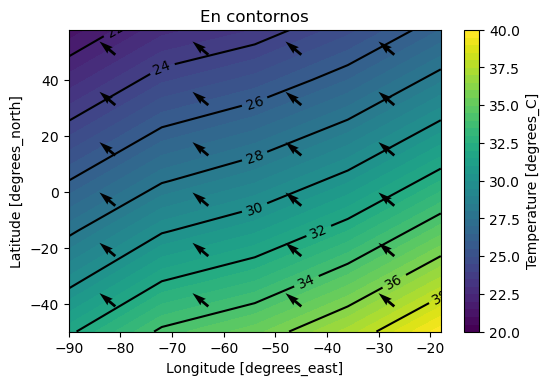

In [10]:
levels = np.arange(20, 40.5, 0.5)

fix, ax = plt.subplots(dpi=100)
temp.plot.contourf(ax=ax, vmin=20, vmax=40, levels=levels)
CS = temp.plot.contour(ax=ax, vmin=20, vmax=40, colors="k", levels=levels[::4])
ax.quiver(lon + dx / 2, lat + dy / 2, u_arr, v_arr)
ax.set_ylim(lat.min(), lat.max())
ax.set_xlim(lon.min(), lon.max())
ax.clabel(CS, colors="k", fmt="%i")
ax.set_title("En contornos")

---

La discretización de la ecuacion a resolver se hara con un esquema centrado en el espacio y adelantado en el tiempo

$$
\left(\frac{T_{i,j}^{n+1} - T_{i,j}^{n}}{\Delta t}\right) + u \left(\frac{T_{i+1,j}^{n} - T_{i-1,j}^{n}}{2\Delta x} \right) + v \left( \frac{T_{i,j+1}^{n} - T_{i,j-1}^{n}}{2\Delta y} \right) = 0
$$

De donde

$$
T_{i,j}^{n+1} = \Delta t \ T_{i,j}^{n} - \frac{u \Delta t}{2 \Delta x} \left( T_{i+1,j}^{n} - T_{i-1,j}^{n} \right) - \frac{v \Delta t}{2 \Delta y} \left( T_{i,j+1}^{n} - T_{i,j-1}^{n} \right)
$$

Implementamos la discretizacion obtenida en una función que nos permitirá obtener la temperatura pronosticada

In [11]:
def solve(inarr, dt, u, v, nt, tstart="2020-05-20T00:00", plot=False, dynamic=False):
    """
    Resuelve la ecuacion de momento en dos dimensiones con velocidades constantes
    
    Parametros
    ----------
    inarr: DataArray
        Objeto de xarray con grilla regular (lat, lon) que
        representa el campo inicial
    dt: int
        Salto de tiempo
    u: float
        Valor de la velocidad zonal
    v: float
        Valor de la velocidad meridional
    nt: int
        Saltos de tiempo a resolver
    tstart: string, opcional
        Fecha inicial de la simulación. Útil para la dimension
        tiempo a agregar en el array de salida. 
        Por defecto toma el valor 2020-05-20T00:00
    
    Retorna
    -------
    outarr: DataArray
        Arreglo con las mismas coordenadas que inarr pero con
        dimension `time` agregada de longitud `nt`+1 y
        saltos `dt`.
    """
    tdelta = pd.Timedelta(dt, unit="s")
    tstart = pd.to_datetime(tstart)
    outarr = xr.DataArray(
        np.nan,
        coords=[
            ("time", pd.date_range(tstart, tstart + (tdelta * nt), freq=f"{dt}s")),
            ("lat", inarr.lat),
            ("lon", inarr.lon),
        ],
    )
    outarr[0] = inarr
    for i in range(outarr.time.size - 1):
        current_time = outarr.isel(time=i)
        cdiffx = current_time.differentiate("lon") / 1000
        cdiffy = current_time.differentiate("lat") / 1000
        outarr[i + 1] = (current_time) - (u * dt * cdiffx) - (v * dt * cdiffy)

    # Colocamos la metadata
    outarr.lat.attrs = inarr.lat.attrs
    outarr.lon.attrs = inarr.lon.attrs
    outarr.attrs = inarr.attrs
    outarr.name = "forecast_temp"

    # En caso de querer retornar el gráfico
    if plot:
        hmap = (
            hv.Dataset(outarr)
            .to(hv.Image, kdims=["lon", "lat"])
            .redim.range(forecast_temp=(20, 40))
        )
        cont = hv.operation.contours(hmap, filled=True, dynamic=dynamic).redim.range(
            forecast_temp=(20, 40)
        )
        xx, yy = np.meshgrid(
            np.linspace(lon.min(), lon.max(), 30), np.linspace(lat.min(), lat.max(), 30)
        )
        vector = hv.VectorField(
            (xx, yy, np.full_like(xx, np.arctan2(v, u)), np.full_like(xx, 1),)
        )
        cont.opts(
            hv.opts.Polygons(
                tools=["hover"],
                ylim=(lat.min(), lat.max()),
                xlim=(lon.min(), lon.max()),
                width=600,
                height=400,
            )
        )
        if dynamic:
            return pn.panel(
                cont * vector, widget_type="scrubber", widget_location="bottom"
            )
        return cont * vector

    return outarr

In [12]:
fore_temp = solve(temp, 100, u, v, 36)
fore_temp

<xarray.DataArray 'forecast_temp' (time: 37, lat: 7, lon: 5)>
array([[[21.2       , 22.8       , 23.5       , 24.8       ,
         26.5       ],
        [22.7       , 24.4       , 25.2       , 26.5       ,
         28.4       ],
        [24.3       , 26.1       , 27.        , 28.4       ,
         30.4       ],
        ...,
        [27.8       , 29.9       , 30.9       , 32.5       ,
         34.8       ],
        [29.7       , 32.        , 33.        , 34.8       ,
         37.2       ],
        [31.8       , 34.2       , 35.3       , 37.2       ,
         39.8       ]],

       [[21.28516093, 22.87425488, 23.57228602, 24.88718133,
         26.59813891],
        [22.78938986, 24.47848381, 25.27502542, 26.59266012,
         28.5053469 ],
        [24.39486865, 26.1839626 , 27.08050421, 28.49938878,
         30.51082569],
        ...,
        [27.90880529, 29.99741991, 30.98997226, 32.61308575,
         34.92726207],
        [29.81851301, 32.1028987 , 33.09670092, 34.92130394,
         37.33399072],
        [31.9239918 , 34.30712763, 35.40217971, 37.3270224 ,
         39.94244857]],

       [[21.37010268, 22.9484237 , 23.64483306, 24.9748847 ,
         26.69678444],
        [22.87857615, 24.55687499, 25.35036471, 26.68592446,
         28.61123031],
        [24.48954936, 26.26786382, 27.16137515, 28.59938178,
         30.62214467],
        ...,
        [28.01749845, 30.09471188, 31.08031183, 32.72693238,
         35.05515188],
        [29.93675067, 32.20559384, 33.19382856, 35.04333752,
         37.4685492 ],
        [32.04761817, 34.41403608, 35.50479271, 37.45478756,
         40.08556813]],

       ...,

       [[24.00216264, 25.32324729, 26.16508485, 28.08144203,
         30.11216885],
        [25.65339691, 27.06983977, 27.99234654, 30.00346958,
         32.25963163],
        [27.45348787, 28.97450857, 29.99770177, 32.12459301,
         34.42322115],
        ...,
        [31.43172593, 33.18495241, 34.25066676, 36.78475555,
         39.4399404 ],
        [33.58545981, 35.45216232, 36.60746493, 39.3322471 ,
         42.04571788],
        [35.83858482, 37.79682086, 39.09714683, 41.95309494,
         45.02553729]],

       [[24.08279496, 25.39912477, 26.25184562, 28.18828056,
         30.22634622],
        [25.73873052, 27.15031498, 28.08394639, 30.11756603,
         32.38072641],
        [27.54520885, 29.06148085, 30.0956073 , 32.24486809,
         34.54861964],
        ...,
        [31.53668686, 33.28263367, 34.36098021, 36.92429289,
         39.5844319 ],
        [33.69614981, 35.55481814, 36.72583444, 39.47784881,
         42.19636626],
        [35.95324392, 37.90396827, 39.22129113, 42.10691425,
         45.19155467]],

       [[24.16340315, 25.47520847, 26.33918852, 28.29570889,
         30.34091513],
        [25.82405799, 27.23102219, 28.17618634, 30.23226975,
         32.50216993],
        [27.63695012, 29.14870076, 30.19415321, 32.3657375 ,
         34.67435742],
        ...,
        [31.64158608, 33.38051638, 34.4721074 , 37.06454827,
         39.72925371],
        [33.80672167, 35.65770666, 36.84501651, 39.62410983,
         42.34743403],
        [36.06777845, 38.01136924, 39.34627498, 42.2615627 ,
         45.35831962]]])
Coordinates:
  * time     (time) datetime64[ns] 2020-05-20 ... 2020-05-20T01:00:00
  * lat      (lat) int32 58 40 22 4 -14 -32 -50
  * lon      (lon) int32 -90 -72 -54 -36 -18
Attributes:
    long_name:  Temperature
    units:      degrees_C

Exploramos el resultado

In [13]:
solve(temp, 100, u, v, 36, plot=True)

:HoloMap   [time]
   :Overlay
      .Polygons.I    :Polygons   [lon,lat]   (forecast_temp)
      .VectorField.I :VectorField   [x,y]   (Angle,Magnitude)

---

## Live Demo

En caso de estar visualizando este notebook en binder, podemos modificar algunos parámetros y observar como el campo evoluciona en el tiempo.

In [14]:
live_panel = interact(
    solve,
    inarr=fixed(temp),
    dt=(10, 110, 10, 100),
    u=(-15, 15, 0.1, u),
    v=(-15, 15, 0.1, v),
    nt=(18, 36 * 5, 18, 36),
    plot=fixed(True),
    dynamic=fixed(True),
)
live_panel

Column
    [0] Column
        [0] IntSlider(end=110, name='dt', start=10, step=10, value=100)
        [1] FloatSlider(end=15, name='u', start=-15, value=-5.399999999999999)
        [2] FloatSlider(end=15, name='v', start=-15, value=4.400000000000002)
        [3] IntSlider(end=180, name='nt', start=18, step=18, value=36)
    [1] Row
        [0] Column
            [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
            [1] Row
                [0] HSpacer()
                [1] WidgetBox
                    [0] Player(end=36, width=550)
                [2] HSpacer()